Crop: almond


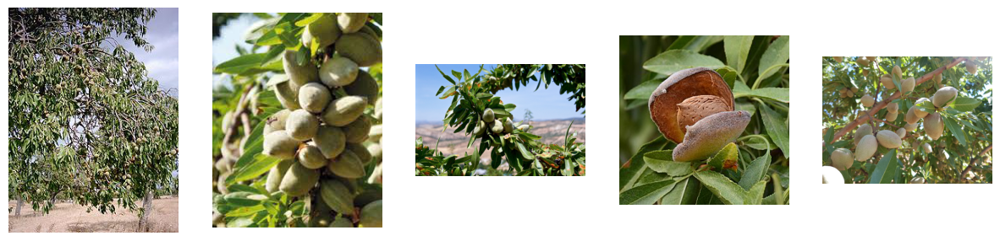

Crop: banana


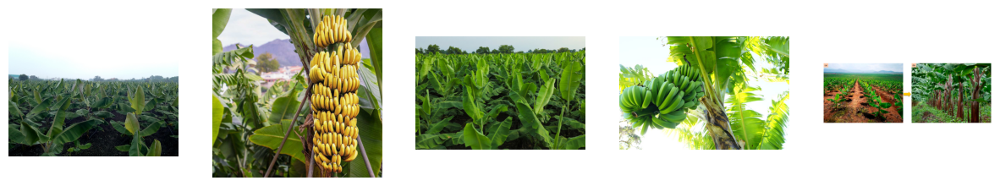

Crop: cardamom


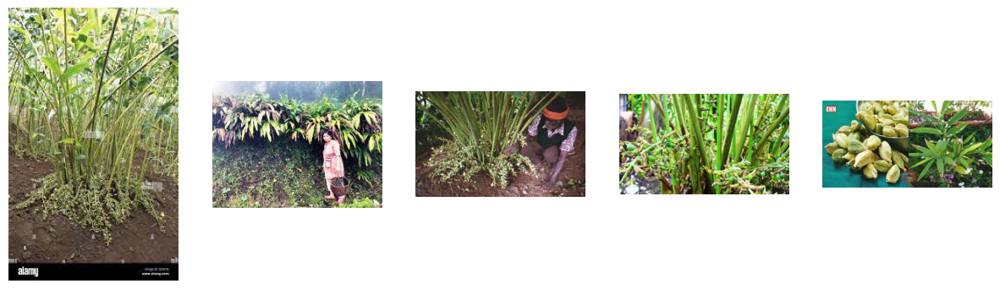

Crop: Cherry


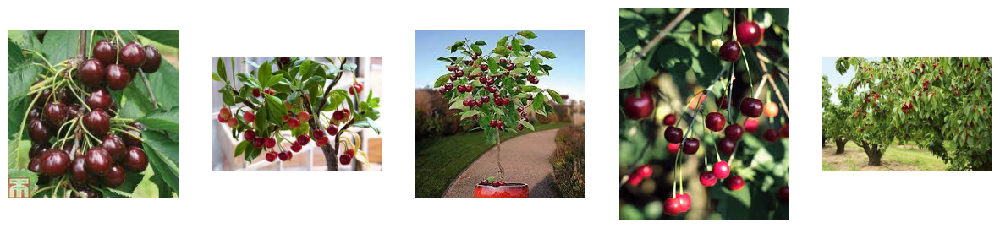

Crop: chilli


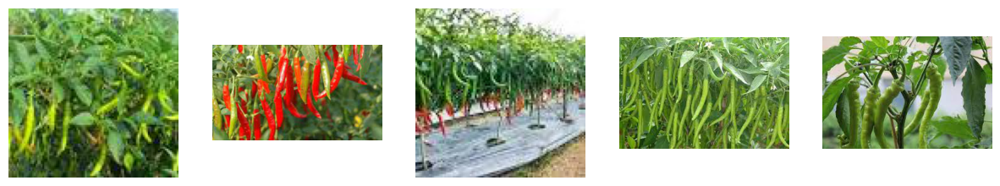

Crop: clove


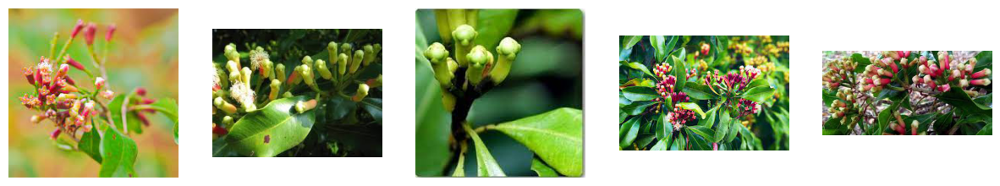

Crop: coconut


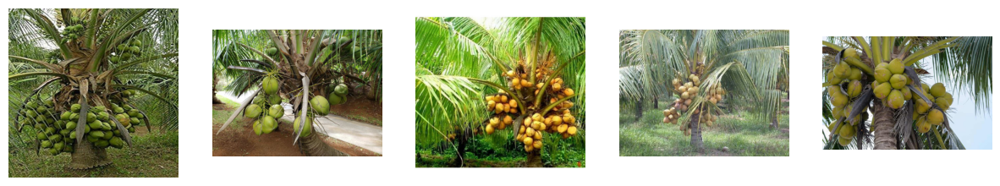

Crop: Coffee-plant


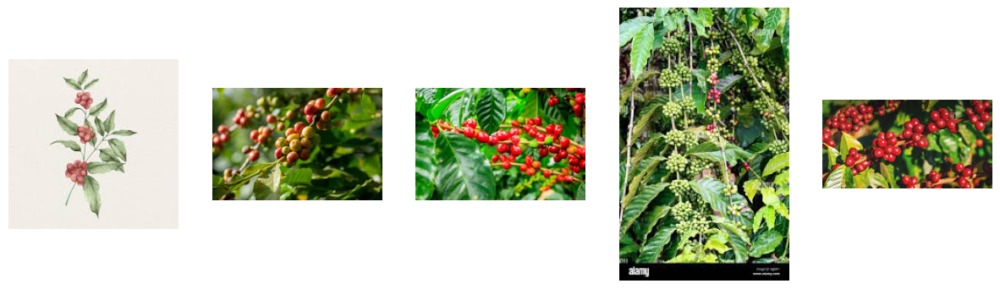

Crop: cotton


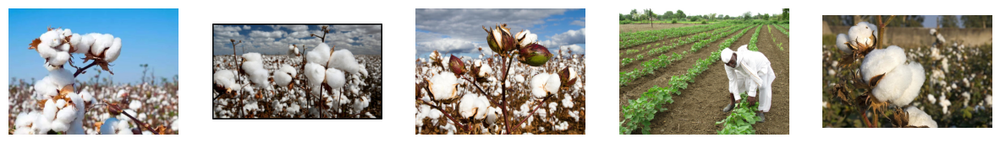

Crop: Cucumber


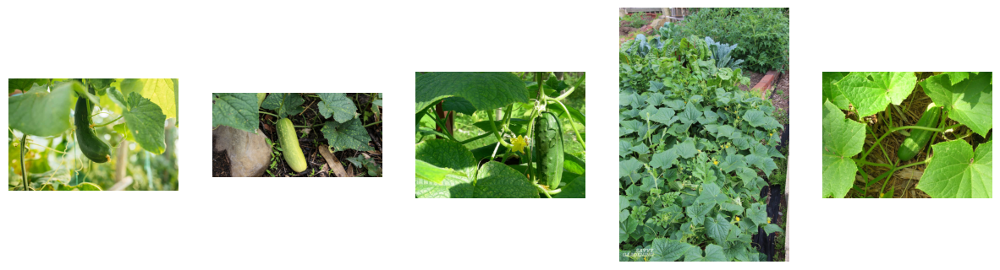

Crop: Fox_nut(Makhana)


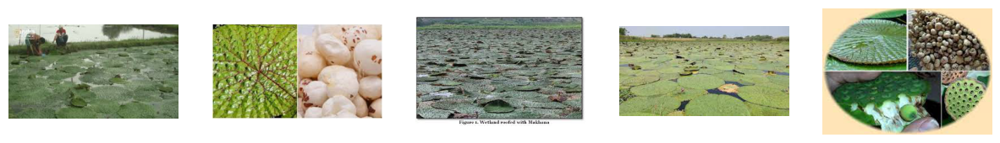

Crop: gram


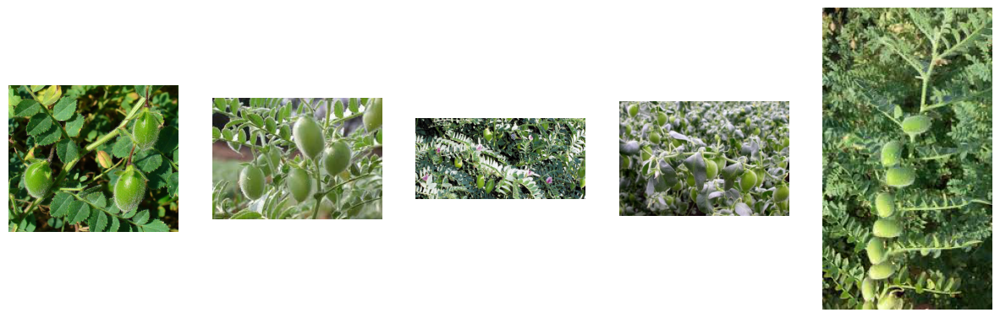

Crop: jowar


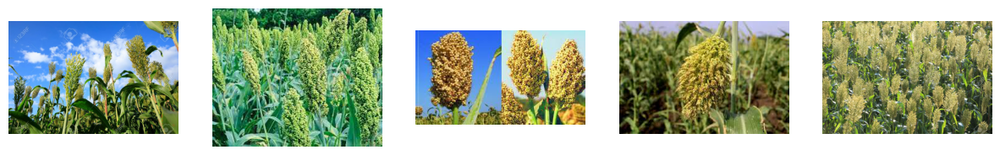

Crop: jute


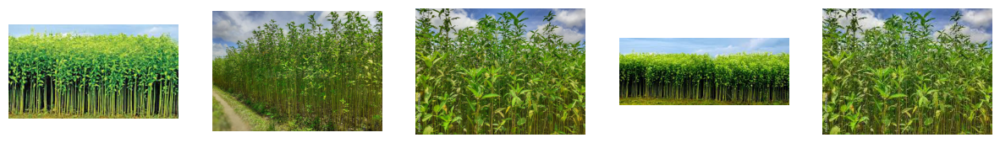

Crop: Lemon


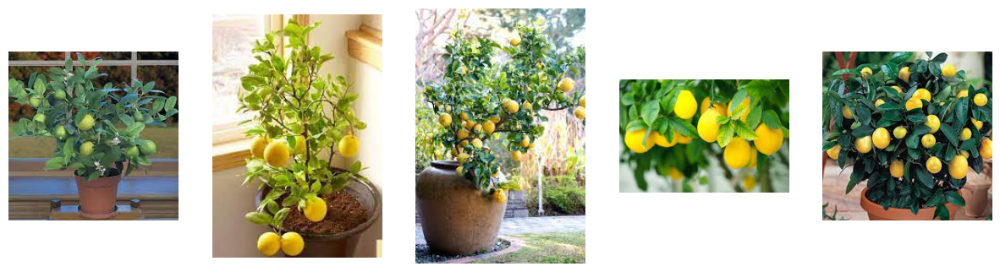

Crop: maize


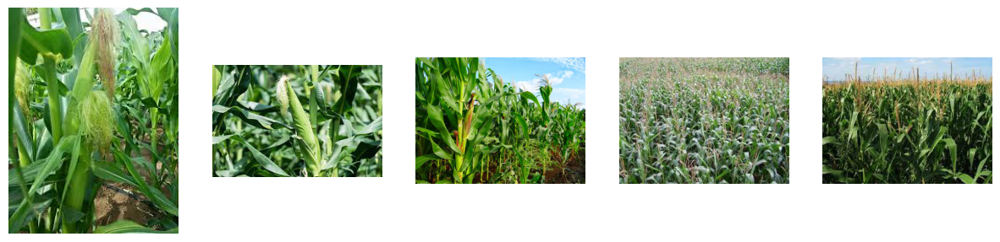

Crop: mustard-oil


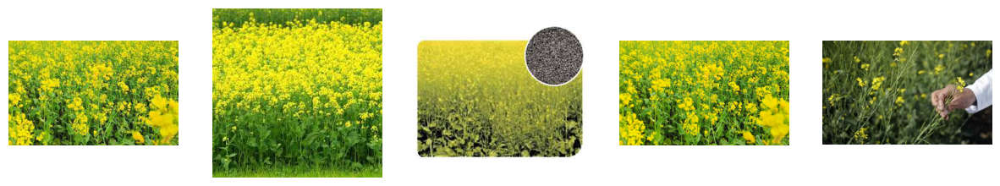

Crop: Olive-tree


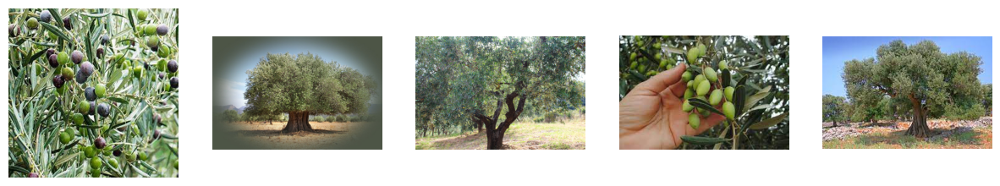

Crop: papaya


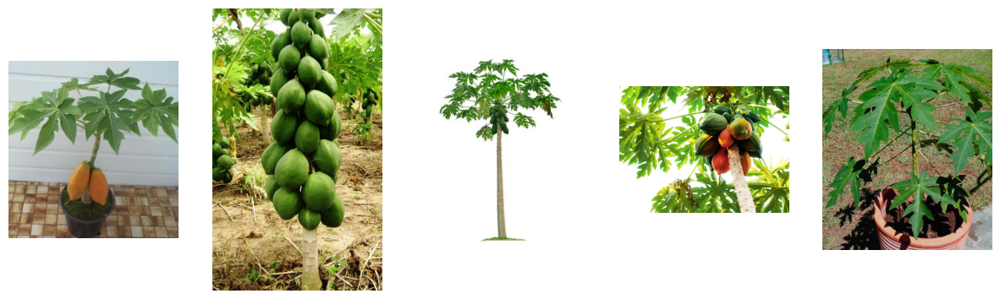

Crop: Pearl_millet(bajra)


SyntaxError: not a PNG file (<string>)

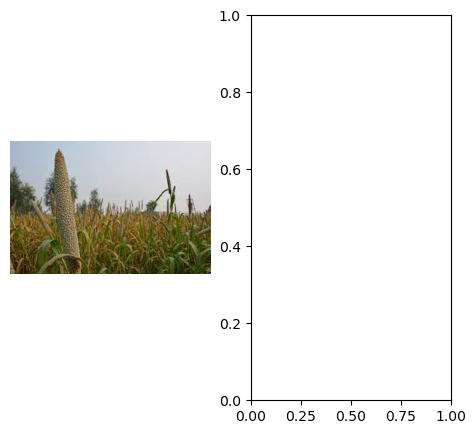

In [2]:
import warnings
warnings.filterwarnings("ignore")

import tensorflow as tf  # Import TensorFlow, a deep learning framework.
from tensorflow.keras.preprocessing.image import ImageDataGenerator  # Import ImageDataGenerator for data augmentation.
from tensorflow.keras.models import Sequential  # Create a sequential neural network model.
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense  # Define layers for the neural network.
from tensorflow.keras.initializers import GlorotNormal  # Initialize layer weights using Glorot Normal initialization.
from tensorflow.keras.initializers import HeNormal  # Initialize layer weights using He Normal initialization.

from tensorflow.keras.layers import Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

initializer = HeNormal()
train_dir = "D:\Agricultural_Crops_Classification\Agricultural-crops"

import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

parent_dir = "D:\Agricultural_Crops_Classification\Agricultural-crops"
subfolders = [folder for folder in os.listdir(parent_dir) if os.path.isdir(os.path.join(parent_dir, folder))]

num_images_per_crop = 5

for subfolder in subfolders:
    crop_dir = os.path.join(parent_dir, subfolder)
    image_files = [os.path.join(crop_dir, filename) for filename in os.listdir(crop_dir) if os.path.isfile(os.path.join(crop_dir, filename))]

    if len(image_files) >= num_images_per_crop:
        random_images = random.sample(image_files, num_images_per_crop)

        print(f"Crop: {subfolder}")

        plt.figure(figsize=(15, 5))

        for i, image_path in enumerate(random_images):
            plt.subplot(1, num_images_per_crop, i + 1)
            img = mpimg.imread(image_path)
            plt.imshow(img)
            plt.axis('off')

        plt.show()

In [3]:
train_datagen = ImageDataGenerator(
    rescale=1.0/255,
    rotation_range=10,
    width_shift_range=0.1,
    height_shift_range=0.1,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

In [4]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical'
)

Found 829 images belonging to 30 classes.


In [5]:
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', kernel_initializer=initializer, input_shape=(150, 150, 3)),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(64, (3, 3), activation='relu', kernel_initializer=initializer),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Conv2D(128, (3, 3), activation='relu', kernel_initializer=initializer),
    MaxPooling2D(2, 2),
    BatchNormalization(),
    Flatten(),
    Dense(512, activation='relu', kernel_initializer=initializer, kernel_regularizer=l2(0.001)),
    Dropout(0.5),
    Dense(30, activation='softmax')
])

In [6]:
optimizer = Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [7]:
num_epochs = 100
history = model.fit(
    train_generator,
    steps_per_epoch=len(train_generator),
    epochs=num_epochs,
    verbose=1
)

Epoch 1/100
26/26 [==============================] - 21s 749ms/step - loss: 15.6150 - accuracy: 0.1037
Epoch 2/100
26/26 [==============================] - 18s 680ms/step - loss: 13.6687 - accuracy: 0.1713
Epoch 3/100
26/26 [==============================] - 18s 665ms/step - loss: 10.5977 - accuracy: 0.2364
Epoch 4/100
26/26 [==============================] - 18s 679ms/step - loss: 9.1540 - accuracy: 0.2593
Epoch 5/100
26/26 [==============================] - 19s 723ms/step - loss: 7.5860 - accuracy: 0.2883
Epoch 6/100
26/26 [==============================] - 19s 731ms/step - loss: 7.4835 - accuracy: 0.3064
Epoch 7/100
26/26 [==============================] - 19s 727ms/step - loss: 7.1050 - accuracy: 0.3366
Epoch 8/100
26/26 [==============================] - 19s 734ms/step - loss: 6.5790 - accuracy: 0.3462
Epoch 9/100
26/26 [==============================] - 19s 726ms/step - loss: 6.4146 - accuracy: 0.3571
Epoch 10/100
26/26 [==============================] - 19s 719ms/step - loss: 6.

In [8]:
history.history

{'loss': [15.61500358581543,
  13.66869831085205,
  10.597652435302734,
  9.154035568237305,
  7.586004734039307,
  7.483452796936035,
  7.10504150390625,
  6.578987121582031,
  6.414641857147217,
  6.157963275909424,
  5.868812084197998,
  5.967004776000977,
  5.8707380294799805,
  5.760512828826904,
  5.629580497741699,
  5.581790447235107,
  5.791380405426025,
  5.755586624145508,
  5.724059104919434,
  5.583056926727295,
  5.633124828338623,
  5.661293983459473,
  5.543877124786377,
  5.3493332862854,
  5.444550514221191,
  5.381990909576416,
  5.60119104385376,
  5.298649787902832,
  5.401912689208984,
  5.434756278991699,
  5.447723865509033,
  5.347947120666504,
  5.215046405792236,
  5.385701656341553,
  5.283624172210693,
  5.213995456695557,
  5.23907995223999,
  5.204860210418701,
  5.214400291442871,
  5.257567882537842,
  5.0293145179748535,
  5.167830467224121,
  5.048244476318359,
  4.9403862953186035,
  5.068201541900635,
  5.1639580726623535,
  5.150518894195557,
  5.1

In [9]:
train_loss, train_accuracy = model.evaluate(train_generator, steps=len(train_generator))

print(f"Training Loss: {train_loss:.4f}")
print(f"Training Accuracy: {train_accuracy:.4f}")

26/26 [==============================] - 9s 329ms/step - loss: 4.8550 - accuracy: 0.8697
Training Loss: 4.8550
Training Accuracy: 0.8697


In [10]:
    
# Define the directory for the testing set
test_dir = "D:\Agricultural_Crops_Classification\Testing_Dataset"

# Create a data generator for the testing set
test_datagen = ImageDataGenerator(rescale=1.0/255)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=32,  # You can adjust this batch size as needed
    class_mode='categorical'
)

# Evaluate the model on the testing set
test_loss, test_accuracy = model.evaluate(test_generator, steps=len(test_generator))

print(f"Testing Loss: {test_loss:.4f}")
print(f"Testing Accuracy: {test_accuracy:.4f}")


Found 151 images belonging to 30 classes.
5/5 [==============================] - 2s 319ms/step - loss: 5.3948 - accuracy: 0.8079
Testing Loss: 5.3948
Testing Accuracy: 0.8079
